<img src="https://storage.googleapis.com/kaggle-competitions/kaggle/37644/logos/header.png?t=2022-08-05-15-26-16" width=1500 class="center">

<h1 style="font-size:60px;" align="center">🐎 Big Data Derby 2022 Analysis 🐎</h1>

## **Goal of the Competition** 

The goal of this competition is to analyze horse racing tactics, drafting strategies, and path efficiency. You will develop a model using never-before-released coordinate data along with basic race information.

Your work will help racing horse owners, trainers, and veterinarians better understand how equine performance and welfare fit together. With better data analysis, equine welfare could significantly improve.

## **Context** 

Injury prevention is a critical component in modern athletics. Sports that involve animals, such as horse racing, are no different than human sport. Typically, efficiency in movement correlates to both improvements in performance and injury prevention.

A wealth of data is now collected, including measures for heart rate, EKG, longitudinal movement, dorsal/ventral movement, medial/lateral deviation, total power and total landing vibration. Your data science skills and analysis are needed to decipher what makes the most positive impact.

In this competition, you will create a model to interpret one aspect of this new data. You’ll be among the first to access X/Y coordinate mapping of horses during races. Using the data, you might analyze jockey decision making, compare race surfaces, or measure the relative importance of drafting. With considerable data, contestants can flex their creativity problem solving skills.

The New York Racing Association (NYRA) and the New York Thoroughbred Horsemen's Association (NYTHA) conduct world class thoroughbred racing at Aqueduct Racetrack, Belmont Park and Saratoga Race Course.

With your help, NYRA and NYTHA will better understand their vast data set, which could lead to new ways of racing and training in a highly traditional industry. With improved use of horse tracking data, you could help improve equine welfare, performance and rider decision making.

## Columns in Dataset
***

- `track_id`: 3 character id for the track the race took place at. AQU -Aqueduct, BEL - Belmont, SAR - Saratoga. 
- `race_date`: date the race took place. YYYY-MM-DD.
- `race_number`: Number of the race. Passed as 3 characters but can be cast or converted to int for this data set.
- `program_number`: Program number of the horse in the race passed as 3 characters. Should remain 3 characters as it isn't limited to just numbers. Is essentially the unique identifier of the horse in the race.
- `trakus_index`:  Trakus is a speed-distance curve measurement system for thoroughbred horseracing that measures the speed of each horse in the race with respect to its distance travelled in the race and from that measurement, the distance between horses at the time of POC (point of call) can be measured.
- `latitude`: The latitude of the horse in the race passed as a float. 
- `longitude`: The longitude of the horse in the race passed as a float. 
- `distance_id`: Distance of the race in furlongs passed as an integer. Example - 600 would be 6 furlongs. 
- `course_type`: The course the race was run over passed as one character. M - Hurdle, D - Dirt, O - Outer turf, I - Inner turf, T - turf.
- `track_condition`: The condition of the course the race was run on passed as three characters. YL - Yielding, FM - Firm, SY - Sloppy, GD - Good, FT - Fast, MY - Muddy, SF - Soft.
- `run_up_distance`: “Run-up” is the distance from where the gate is placed and the timing of the race begins – that is, the point at which the horses reach the published distance of the race.
- `race_type`: The classification of the race passed as as five characters. STK - Stakes, WCL - Waiver Claiming, WMC - Waiver Maiden Claiming, SST - Starter Stakes, SHP - Starter Handicap, CLM - Claiming, STR - Starter Allowance, AOC - Allowance Optionl Claimer, SOC - Starter Optional Claimer, MCL - Maiden Claiming, ALW - Allowance, MSW - Maiden Special Weight.
- `purse`: In horse racing, the term purse refers to the total amount of money paid out to the owners of horses racing at a particular track over a given period of time, or to the percentages of a race's total purse that are awarded to each of the highest finishers. 
- `post_time`: Post time is the designated starting time of a horse race.
- `weight_carried`:  horse can carry a weight during a race which includes the weight of the saddle and the person riding it.
- `jockey`: Name of jockey (the guys that actually rise the horse in the race)
- `odds`: the return you can expect to get if the horse you bet on is successful

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pandas_profiling import ProfileReport

import plotly.express as px #graphing
import plotly.graph_objects as go #graphing
from plotly.subplots import make_subplots #graphing
import plotly.figure_factory as ff #graphing
import matplotlib.pyplot as plt #graphing
import seaborn as sns #graphing
import missingno as msno #describe data
import os

colors = ["#FFFFFF", "#6CD4FF", "#F7DF00", "#E60000"]

from plotly.offline import plot, iplot, init_notebook_mode
import plotly.graph_objs as go
init_notebook_mode(connected=True)

plt.rcParams["figure.figsize"] = (12, 8)


# Dataset Overview

In [4]:
# horse/jockey race data
nyra_start_table = pd.read_csv("D:/Kaggle/Horse Riding/input/big-data-derby-2022/nyra_start_table.csv", low_memory = False)
display(nyra_start_table.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14915 entries, 0 to 14914
Data columns (total 7 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   track_id        14915 non-null  object
 1   race_date       14915 non-null  object
 2   race_number     14915 non-null  int64 
 3   program_number  14915 non-null  object
 4   weight_carried  14915 non-null  int64 
 5   jockey          14915 non-null  object
 6   odds            14915 non-null  int64 
dtypes: int64(3), object(4)
memory usage: 815.8+ KB


None

In [5]:
# racetrack race data 
nyra_race_table = pd.read_csv("D:/Kaggle/Horse Riding/input/big-data-derby-2022/nyra_race_table.csv", low_memory = False)
display(nyra_race_table.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   track_id         2000 non-null   object
 1   race_date        2000 non-null   object
 2   race_number      2000 non-null   int64 
 3   distance_id      2000 non-null   int64 
 4   course_type      2000 non-null   object
 5   track_condition  2000 non-null   object
 6   run_up_distance  2000 non-null   int64 
 7   race_type        2000 non-null   object
 8   purse            2000 non-null   int64 
 9   post_time        2000 non-null   int64 
dtypes: int64(5), object(5)
memory usage: 156.4+ KB


None

In [6]:
# tracking data 
nyra_tracking_table = pd.read_csv("D:/Kaggle/Horse Riding/input/big-data-derby-2022/nyra_tracking_table.csv", low_memory = False)
display(nyra_tracking_table.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5228430 entries, 0 to 5228429
Data columns (total 7 columns):
 #   Column          Dtype  
---  ------          -----  
 0   track_id        object 
 1   race_date       object 
 2   race_number     int64  
 3   program_number  object 
 4   trakus_index    int64  
 5   latitude        float64
 6   longitude       float64
dtypes: float64(2), int64(2), object(3)
memory usage: 279.2+ MB


None

In [7]:
dtype_dict = {"track_id": object ,
              #"race_date" : will be read with "parse_dates" parameter
              "race_number" : np.int8, 
              "program_number" : object,
              "trakus_index" : np.int16,  
              "latitude" : np.float64,
              "longitude" : np.float64,
              "distance_id" : np.int16,  
              "course_type" : object, 
              "track_condition" : object,
              "run_up_distance" : np.int8,  
              "race_type" : object, 
              "purse" : np.int32,  
              "post_time" : np.int16,  
              "weight_carried" : np.int16,  
              "jockey" : object, 
              "odds" : np.int16,
             }

df = pd.read_csv("D:/Kaggle/Horse Riding/input/big-data-derby-2022/nyra_2019_complete.csv", 
                 dtype = dtype_dict, parse_dates=["race_date"])

By passing the data types directly to the `read_csv()` function, we were able to **reduce the required memory for storage from 678 MB to 438 MB!**

In [8]:
data = ProfileReport(df)

In [9]:
data.to_widgets()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

d:\MiniConda3\envs\Horse_Racing\lib\site-packages\scipy\stats\_stats_py.py:5215: RuntimeWarning:

overflow encountered in longlong_scalars



Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

### Analysis from above Report
1. The four csv files have three common key columns: `track_id`, `race_data`, `race_number`
2. *We don't have any missing values*.
3. We have 6 categorical variables, 10 numeric variables and 1 DateTime variable.
4. `weight_carried`, `post_time`, `run_up_distance`, `track_condition`, `course_type`, `distance_id`, `latitude` , `longitude`, `trakus_index`, `race_number` , `track_id` are highly coorelated features.


# Tracking

In [10]:
nyra_tracking_table['race_date'] = pd.to_datetime(nyra_tracking_table['race_date'])
nyra_tracking_table['day'], nyra_tracking_table['month'] = nyra_tracking_table['race_date'].dt.day, nyra_tracking_table['race_date'].dt.month

In [12]:
nyra_tracking_table['track_id'].unique()

array(['AQU', 'BEL', 'SAR'], dtype=object)

Tracking Ids:
'AQU': AQUEDUCT, 
'BEL': BELMONT PARK, 
'SAR': SARATOGA

## Aqueduct track

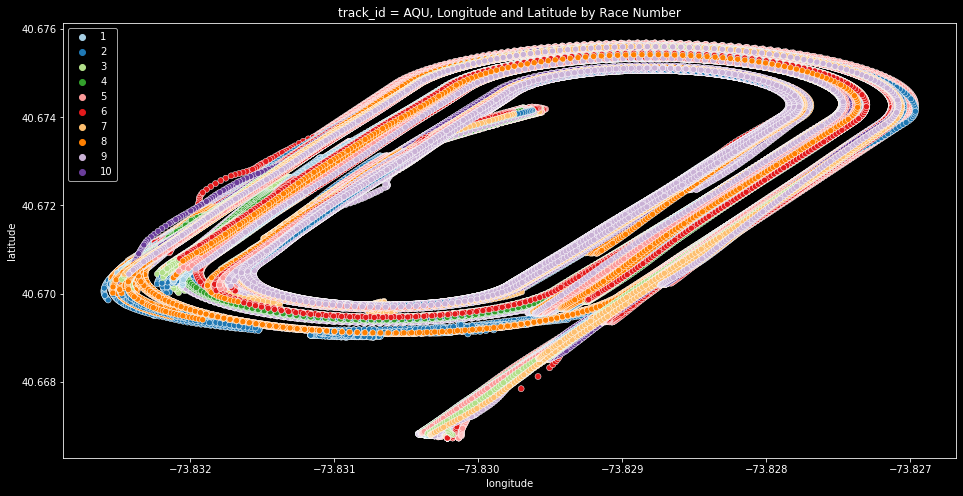

In [13]:
nyra_tracking_0 = nyra_tracking_table[nyra_tracking_table["track_id"] == "AQU"]
nyra_tracking_1 = nyra_tracking_0[nyra_tracking_0["month"] == 11]

plt.style.use("dark_background")
plt.figure(figsize = (16, 8))
sns.scatterplot(data = nyra_tracking_1, x = "longitude", y = "latitude", hue = "race_number", palette = "Paired")

plt.title("track_id = AQU, Longitude and Latitude by Race Number")
plt.legend()

## Belmont Park track

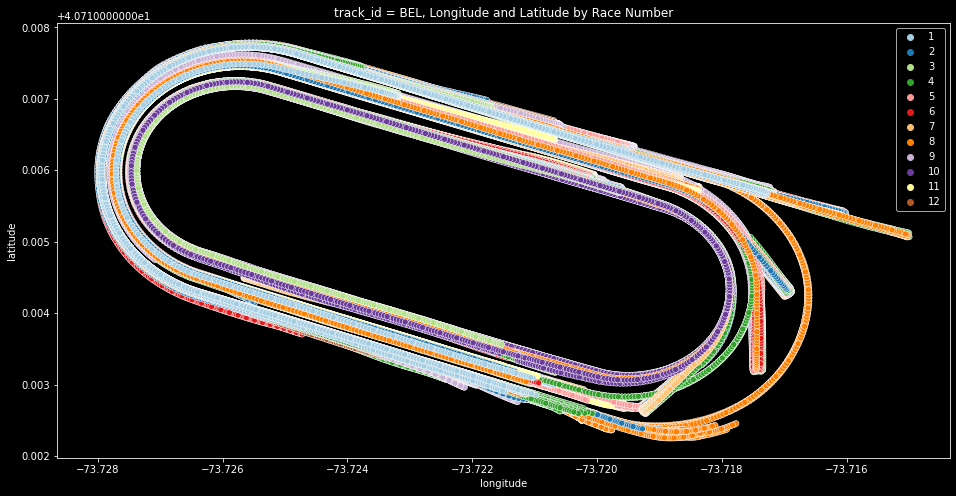

In [14]:
nyra_tracking_0 = nyra_tracking_table[nyra_tracking_table["track_id"] == "BEL"]
nyra_tracking_1 = nyra_tracking_0[nyra_tracking_0["month"] == 5]

plt.style.use("dark_background")
plt.figure(figsize = (16, 8))
sns.scatterplot(data = nyra_tracking_1, x = "longitude", y = "latitude", hue = "race_number", palette = "Paired")

plt.title("track_id = BEL, Longitude and Latitude by Race Number")
plt.legend()

## Saratoga track

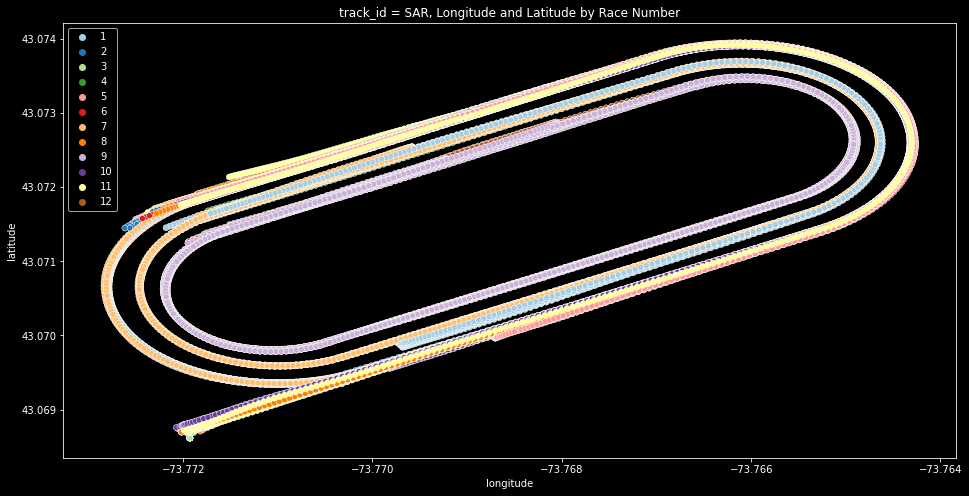

In [15]:
nyra_tracking_0 = nyra_tracking_table[nyra_tracking_table["track_id"] == "SAR"]
nyra_tracking_1 = nyra_tracking_0[nyra_tracking_0["month"] == 9]

plt.style.use("dark_background")
plt.figure(figsize = (16, 8))
sns.scatterplot(data = nyra_tracking_1, x = "longitude", y = "latitude", hue = "race_number", palette = "Paired")

plt.title("track_id = SAR, Longitude and Latitude by Race Number")
plt.legend()

# Carried Weight & Steeplechase Races

> The Kentucky Derby, for example, has a weight limit of 126 lb (57 kg) including the jockey's equipment. The weight of a jockey usually ranges from 108 to 118 lb (49 to 54 kg).

The average weight of each jockey is plotted in the below boxplot.

d:\MiniConda3\envs\Horse_Racing\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:xlabel='weight_carried'>

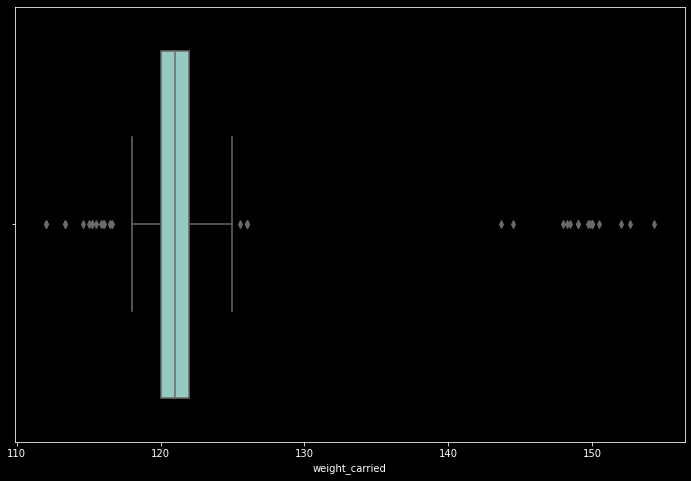

In [16]:
sns.boxplot(nyra_start_table.groupby("jockey").weight_carried.mean())

What's strange is that there are some average `weight_carried` above 140 lbs. 
Let's have a look at the top 5 heaviest jockeys.

In [17]:
for jockey in (nyra_start_table.groupby("jockey").weight_carried.mean().sort_values(ascending=False).head(5).index):
    display(nyra_start_table[nyra_start_table.jockey == jockey])

,track_id,race_date,race_number,program_number,weight_carried,jockey,odds
9963,BEL,2019-09-19,1,9,160,Thomas Garner,90
12260,SAR,2019-07-21,1,6,156,Thomas Garner,1500
12359,SAR,2019-07-24,1,1,156,Thomas Garner,325
12445,SAR,2019-07-25,1,3,144,Thomas Garner,335
13619,SAR,2019-08-14,1,3,156,Thomas Garner,700
14064,SAR,2019-08-22,1,2,154,Thomas Garner,55


,track_id,race_date,race_number,program_number,weight_carried,jockey,odds
9900,BEL,2019-09-18,1,6,153,Sean McDermott,1350
9955,BEL,2019-09-19,1,1,158,Sean McDermott,650
12259,SAR,2019-07-21,1,5,146,Sean McDermott,1560
12364,SAR,2019-07-24,1,5,153,Sean McDermott,1540
12451,SAR,2019-07-25,1,9,154,Sean McDermott,335
14419,SAR,2019-08-28,1,7,152,Sean McDermott,1920


,track_id,race_date,race_number,program_number,weight_carried,jockey,odds
9958,BEL,2019-09-19,1,4,152,Rachael Blackmore,840


,track_id,race_date,race_number,program_number,weight_carried,jockey,odds
9957,BEL,2019-09-19,1,3,144,Ross Geraghty,1760
12256,SAR,2019-07-21,1,1,156,Ross Geraghty,90
12361,SAR,2019-07-24,1,2,153,Ross Geraghty,375
12441,SAR,2019-07-25,1,10,144,Ross Geraghty,2030
13617,SAR,2019-08-14,1,1,150,Ross Geraghty,760
14415,SAR,2019-08-28,1,3,156,Ross Geraghty,75


,track_id,race_date,race_number,program_number,weight_carried,jockey,odds
13201,SAR,2019-08-07,1,2,150,Mark Watts,540


>  Those high weights are in what are called steeplechase races, where horse and jockey jump over fences throughout the race. 


According to the competition host's answer in this [this discussion](https://www.kaggle.com/competitions/big-data-derby-2022/discussion/344315)

We have `track_id`, `race_date`, `race_number` common in all four csv files. So, we will combine them in `race_id`.

In [18]:
key_columns = ["track_id", "race_date", "race_number"]

for nyra_df in [nyra_start_table, nyra_race_table, nyra_tracking_table, df]:
    nyra_df["race_id"] = nyra_df[key_columns].astype(str).agg('_'.join, axis=1)
    
display(nyra_start_table[key_columns].astype(str).agg('_'.join, axis=1))

0         AQU_2019-01-01_1
1         AQU_2019-01-01_1
2         AQU_2019-01-01_1
3         AQU_2019-01-01_1
4         AQU_2019-01-01_1
               ...        
14910    SAR_2019-09-02_11
14911    SAR_2019-09-02_11
14912    SAR_2019-09-02_11
14913    SAR_2019-09-02_11
14914    SAR_2019-09-02_11
Length: 14915, dtype: object

In [19]:
temp = pd.merge(nyra_race_table, nyra_start_table.groupby('race_id').weight_carried.mean().to_frame(), on='race_id')
display(temp[temp.weight_carried >= 127])

steeplechase_races = temp[temp.weight_carried >= 127].race_id.values
print("Steeplechase Races", steeplechase_races)

,track_id,race_date,race_number,distance_id,course_type,track_condition,run_up_distance,race_type,purse,post_time,race_id,weight_carried
1346,BEL,2019-09-18,1,1800,M,FM,0,STK,75000,302,BEL_2019-09-18_1,150.857143
1354,BEL,2019-09-19,1,2000,M,FM,0,STK,150000,304,BEL_2019-09-19_1,148.444444
1667,SAR,2019-07-21,1,1650,M,FM,0,ALW,65000,1220,SAR_2019-07-21_1,152.285714
1680,SAR,2019-07-24,1,1650,M,GD,0,STK,75000,1250,SAR_2019-07-24_1,153.333333
1690,SAR,2019-07-25,1,1650,M,FM,0,STK,150000,1245,SAR_2019-07-25_1,145.416667
1780,SAR,2019-08-07,1,1650,M,FM,0,STK,75000,1250,SAR_2019-08-07_1,148.833333
1831,SAR,2019-08-14,1,1650,M,FM,32,ALW,65000,1250,SAR_2019-08-14_1,152.000000
1890,SAR,2019-08-22,1,1900,M,YL,0,STK,150000,1250,SAR_2019-08-22_1,145.000000
1934,SAR,2019-08-28,1,1900,M,FM,0,ALW,65000,1250,SAR_2019-08-28_1,151.714286


Steeplechase Races ['BEL_2019-09-18_1' 'BEL_2019-09-19_1' 'SAR_2019-07-21_1'
 'SAR_2019-07-24_1' 'SAR_2019-07-25_1' 'SAR_2019-08-07_1'
 'SAR_2019-08-14_1' 'SAR_2019-08-22_1' 'SAR_2019-08-28_1']


# Trakus Index Race Animation

## Jockey: **Samuel Camacho Jr**.

In [20]:
jockey = df[df["jockey"] == "Samuel Camacho Jr."]
jockey6 = jockey[jockey["race_number"] == 6]
jockeyBEL = jockey6[jockey6["track_id"] == "BEL"]
jockeyALW = jockeyBEL[jockeyBEL["race_type"] == "ALW"]
jockeyCLM = jockeyBEL[jockeyBEL["race_type"] == "CLM"]
jockeyALW = jockeyALW.sort_values(by = "trakus_index", ascending = True)

fig = px.scatter(jockeyALW, x = "longitude", y = "latitude", hover_data = ["race_type", "track_id"],
                 animation_frame = "longitude",
                 range_y = (40.7122, 40.718),
                 range_x = (-73.719, -73.73),
                 #size = "trakus_index",
                 color = "trakus_index", color_continuous_scale = "Turbo", range_color = (0, 299),
                 title = "Samuel Camacho Jr. - Trakus Index,  Race Number = 6,  track_id = BEL")

fig.layout.updatemenus[0].buttons[0].args[1]['frame']['duration'] = 30
fig.layout.updatemenus[0].buttons[0].args[1]['transition']['duration'] = 5
fig.update_traces(marker = dict(symbol = "circle-open", size = 20)) # scaling the markers
fig.update_layout(template = "plotly_dark", font = dict(family = "PT Sans", size = 12))
fig.show()

## Jockey: **Thomas Garner**

In [21]:
jockey = df[df["jockey"] == "Thomas Garner"]
jockey6 = jockey[jockey["race_number"] == 1]
jockeyBEL = jockey6[jockey6["track_id"] == "BEL"]
jockeyALW = jockeyBEL[jockeyBEL["race_type"] == "STK"]
jockeyCLM = jockeyBEL[jockeyBEL["race_type"] == "STK"]
jockeyALW = jockeyALW.sort_values(by = "trakus_index", ascending = True)

fig = px.scatter(jockeyALW, x = "longitude", y = "latitude", hover_data = ["race_type", "track_id"],
                 animation_frame = "longitude",
                 range_y = (40.7161, 43.0707),
                 range_x = (-73.7205, -73.7680),
                # size = "trakus_index",
                 color = "trakus_index", color_continuous_scale = "Turbo", range_color = (0, 299),
                 title = "Thomas Garner - Trakus Index,  Race Number = 1,  track_id = BEL")

fig.layout.updatemenus[0].buttons[0].args[1]['frame']['duration'] = 30
fig.layout.updatemenus[0].buttons[0].args[1]['transition']['duration'] = 5
fig.update_traces(marker = dict(symbol = "circle-open", size = 20)) # scaling the markers
fig.update_layout(template = "plotly_dark", font = dict(family = "PT Sans", size = 12))
fig.show()

## Jockey: **Flavien Prat**

In [22]:
jockey = df[df["jockey"] == "Flavien Prat"]
jockey6 = jockey[jockey["race_number"] == 6]
jockeyBEL = jockey6[jockey6["track_id"] == "BEL"]
jockeyALW = jockeyBEL[jockeyBEL["race_type"] == "ALW"]
jockeyCLM = jockeyBEL[jockeyBEL["race_type"] == "CLM"]
jockeyALW = jockeyALW.sort_values(by = "trakus_index", ascending = True)

fig = px.scatter(jockeyALW, x = "longitude", y = "latitude", hover_data = ["race_type", "track_id"],
                 animation_frame = "longitude",
                 range_y = (40.7122, 40.718),
                 range_x = (-73.719, -73.73),
                # size = "trakus_index",
                 color = "trakus_index", color_continuous_scale = "Turbo", range_color = (0, 299),
                 title = "Flavien Prat - Trakus Index,  Race Number = 6,  track_id = BEL")

fig.layout.updatemenus[0].buttons[0].args[1]['frame']['duration'] = 30
fig.layout.updatemenus[0].buttons[0].args[1]['transition']['duration'] = 5
fig.update_traces(marker = dict(symbol = "circle-open", size = 20)) # scaling the markers
fig.update_layout(template = "plotly_dark", font = dict(family = "PT Sans", size = 12))
fig.show()

## Jockey Flavien Prat - Trakus Index Race Pathing by Odds of Winning

In [23]:
jockey = df[df["jockey"] == "Flavien Prat"]
races_bel = jockey[jockey["track_id"] == 'BEL']

for odds in sorted([690, 650, 1840, 70, 520, 2140, 400, 2775, 700, 160, 1910, 1030, 660]):
    
    df0 = races_bel[races_bel["odds"] == odds]
    
    fig = px.scatter(df0, x = "longitude", y = "latitude", opacity = 0.8,
                     hover_data = ["race_date", "distance_id", "purse"],
                     color = "trakus_index", color_continuous_scale = "Turbo", #range_color = (0, 399),
                     title = f"Flavien Prat Trakus Index Race Pathing,  Odds: {odds}  track_id = BEL")

    fig.update_traces(marker = dict(symbol = "square-open", size = 20)) # scaling the markers
    fig.update_layout(template = "plotly_dark", font = dict(family = "PT Sans", size = 12))
    fig.show()

# Odds of Winning Race

In [24]:
fig = px.scatter(nyra_start_table, x = "weight_carried", y = "odds", hover_data = ["race_number", "jockey"],
                 color = "odds", color_continuous_scale = colors, range_color = (0, 9999),
                 title = "Odds by Weight Carried")

fig.update_traces(marker = dict(size = 8, symbol = "circle")) # scaling the markers
fig.update_layout(template = "plotly_dark", font = dict(family = "PT Sans", size = 18))
fig.show()

In [25]:
nyra_start_table['race_date'] = pd.to_datetime(nyra_start_table['race_date'])
nyra_start_table['day'], nyra_start_table['month'] = nyra_start_table['race_date'].dt.day, nyra_start_table['race_date'].dt.month

In [26]:
fig = px.scatter(nyra_start_table, x = "weight_carried", y = "day", hover_data = ["race_number", "jockey"],
                 color = "odds", color_continuous_scale = colors, range_color = (0, 9999),
                 title = "Odds by Day of Event and Weight Carried")

fig.update_traces(marker = dict(size = 9, symbol = "square")) # scaling the markers
fig.update_layout(template = "plotly_dark", font = dict(family = "PT Sans", size = 18))
fig.show()

In [27]:
fig = px.scatter(nyra_start_table, x = "weight_carried", y = "month", hover_data = ["race_number", "jockey"],
                 color = "odds", color_continuous_scale = colors, range_color = (0, 9999),
                 title = "Odds by Month of Event and Weight Carried")

fig.update_traces(marker = dict(size = 11, symbol = "circle")) # scaling the markers
fig.update_layout(template = "plotly_dark", font = dict(family = "PT Sans", size = 18))
fig.show()

In [28]:
fig = px.scatter(nyra_race_table, x = "post_time", y = "run_up_distance", hover_data = ["race_number", "course_type"],
                 color = "race_number", color_discrete_sequence = colors, #range_color = (0, 9999),
                 title = "Post Time by Run Up Distance")

fig.update_traces(marker = dict(size = 4, symbol = "circle")) # scaling the markers
fig.update_layout(template = "plotly_dark", font = dict(family = "PT Sans", size = 20))
fig.show()

**A special thanks to Matt OP and 
Leonie for their wonderful notebooks.**